# data argumentation

> '데이터 증강'이라는 의미

데이터의 수집이 어려운 경우, 해당 데이터만 가지고 학습을 진행해야하므로, 반복의 횟수를 늘려서 학습을 진행한다. 이러한 경우, 오버피팅이 발생할 수 있다. 그래서 기존 이미지에 약간의 변형들을 주어서 마치 새로운 이미지를 학습하는 것과 같은 효과를 주기위해 이미지 전처리로 data argmentation를 수행합니다.

학습의 과정에서 반드시 필수사항은 아니다. 기존의 데이터만을 사용하여 정확도를 측정한 뒤에, 데이터 셋이 충분하지 않다고 판단되는 경우에 사용한다.

# data argumentation

## 첫번째 방법 - ImageDataGenerator

```python 
    tf.keras.preprocessing.image.ImageDataGenerator(
        featurewise_center=False, samplewise_center=False,
        featurewise_std_normalization=False, samplewise_std_normalization=False,
        zca_whitening=False, zca_epsilon=1e-06, 
        rotation_range=0, 
        width_shift_range=0.0,
        height_shift_range=0.0, 
        brightness_range=None, shear_range=0.0, 
        zoom_range=0.0,
        channel_shift_range=0.0, fill_mode='nearest', cval=0.0,
        horizontal_flip=False, 
        vertical_flip=False, 
        rescale=None,
        preprocessing_function=None, data_format=None, validation_split=0.0, dtype=None
    )
```
### 장점

- 데이터 파이프라인 구축시, 필요한 이미지 전처리 과정을 인자의 추가만으로 구현이 가능하다.

- 데이터에 대한 무작위 처리를 통해서 무한정 데이터를 만들 수 있다.



### 단점

- tf.data.Dataset의 경우, .map()함수를 통해서 사용자 정의 함수를 통해 전처리 과정을 커스터 마이징 할 수 있으나, 기능상 제공되는 이미지 처리만 사용할 수 있다.


### 사용할 수 있는 이미지 처리

- width_shift_range  
    좌우로 shift가 될 범위 또는 비율 (픽셀의 수 범위)


- height_shift_range  
    상하로 shift가 될 범위 또는 비율 (0.3 ...)


- fill_mode    
    'nearest', 'constant', 'reflect', 'wrap'   -> cval은 'constant'일 경우, color의 value를 말한다.
    
    
- horizontal_flip  
    수평으로 뒤집는 것을 추가할 것인가 -> 무작위로 추가된다.


- vertical_flip    
    수직으로 뒤집는 것을 추가할 것인가 -> 무작위로 추가됨.


- rotation_range  
    회전 변화의 범위(int)


- brightness_range  
    밝기 변화의 범위


- zoom_range  
    확대하는 범위


- rescale  
    데이터의 학습을 위해 주로 [0,1]의 범위로 변환하기 위해 사용된다. 디버깅시에는 이미지의 구별이 어렵기 때문에 사용하지 않는다.  
    (0, 255사이의 값일 때 보였지만 0,1사이에서는 모든 점들이 어둡게 보인다.)
    
    
     

In [1]:
from numpy import expand_dims
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt

In [20]:
# 모든 데이터의 픽셀값에 대해서 rescale을 수행한다.
preprocessing = tf.keras.preprocessing.imageImageDataGenerator(rescale = 1/255)

train_dataset = preprocessing.flow_from_directory('./dataset/pets/',
                                          class_mode = 'binary')


NameError: name 'tf' is not defined

In [21]:
image, label = train_dataset[0]

NameError: name 'train_dataset' is not defined

In [ ]:
for image , label in train_dataset:
    print(image.shape)

# 이미지 전처리 테스트

In [4]:
# 테스트할 이미지를 구축한다.
img = load_img('./dataset/pets/Cat/10445.jpg')
data = img_to_array(img)
data.shape

(256, 350, 3)

In [5]:
samples = expand_dims(data, 0)
print(samples.shape)

(1, 256, 350, 3)


In [6]:
def show_datagen(datagen):
    it = datagen.flow(samples, batch_size = 1)

    # nd.array로 사용할 수 있게 된다.
    batch = it.next()
    print(type(batch))


    fig = plt.figure(figsize = (30, 30))

    for i in range(9):
            #들어오는 그래프를 서브플롯중 어디에 위치하게할 것인가를 결정
            plt.subplot(3,3, i + 1)

            # nd.array로 사용할 수 있게 된다.
            batch = it.next()

            image = batch[0].astype('uint8')
            plt.imshow(image)

<class 'numpy.ndarray'>


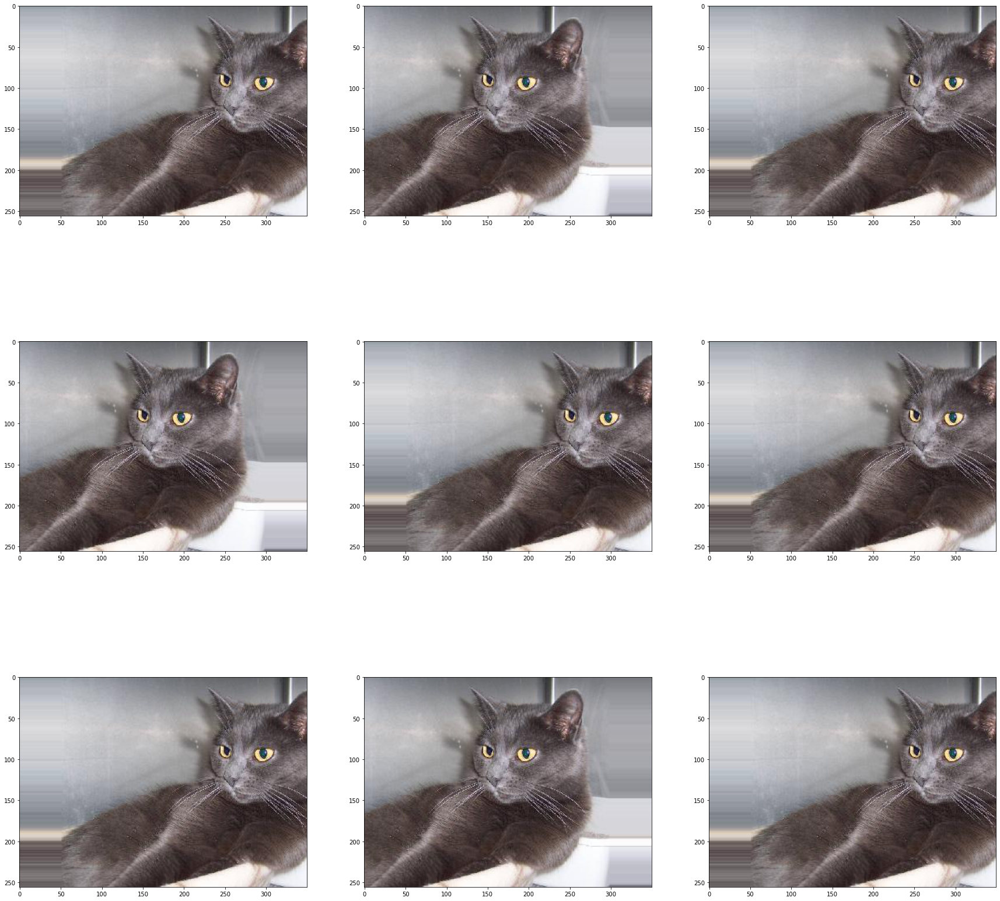

In [8]:
datagen = ImageDataGenerator(width_shift_range=[-50, 50])
it = datagen.flow(samples, batch_size = 1)

# nd.array로 사용할 수 있게 된다.
batch = it.next()
print(type(batch))


fig = plt.figure(figsize = (30, 30))

for i in range(9):
        #들어오는 그래프를 서브플롯중 어디에 위치하게할 것인가를 결정
        plt.subplot(3,3, i + 1)
        
        # nd.array로 사용할 수 있게 된다.
        batch = it.next()

        image = batch[0].astype('uint8')
        plt.imshow(image)

<class 'numpy.ndarray'>


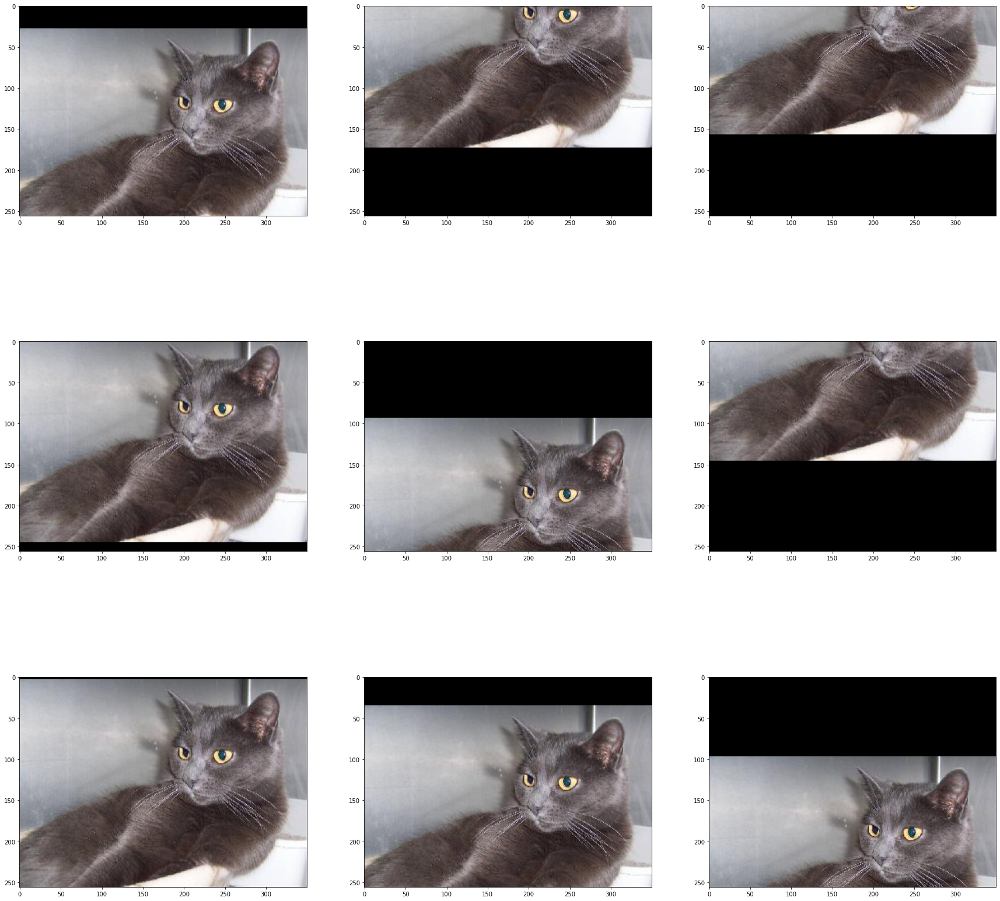

In [9]:
# 위아래로 움직이는 height_shift
datagen = ImageDataGenerator(
    height_shift_range = 0.5,
    fill_mode = 'constant'
)
show_datagen(datagen)

<class 'numpy.ndarray'>


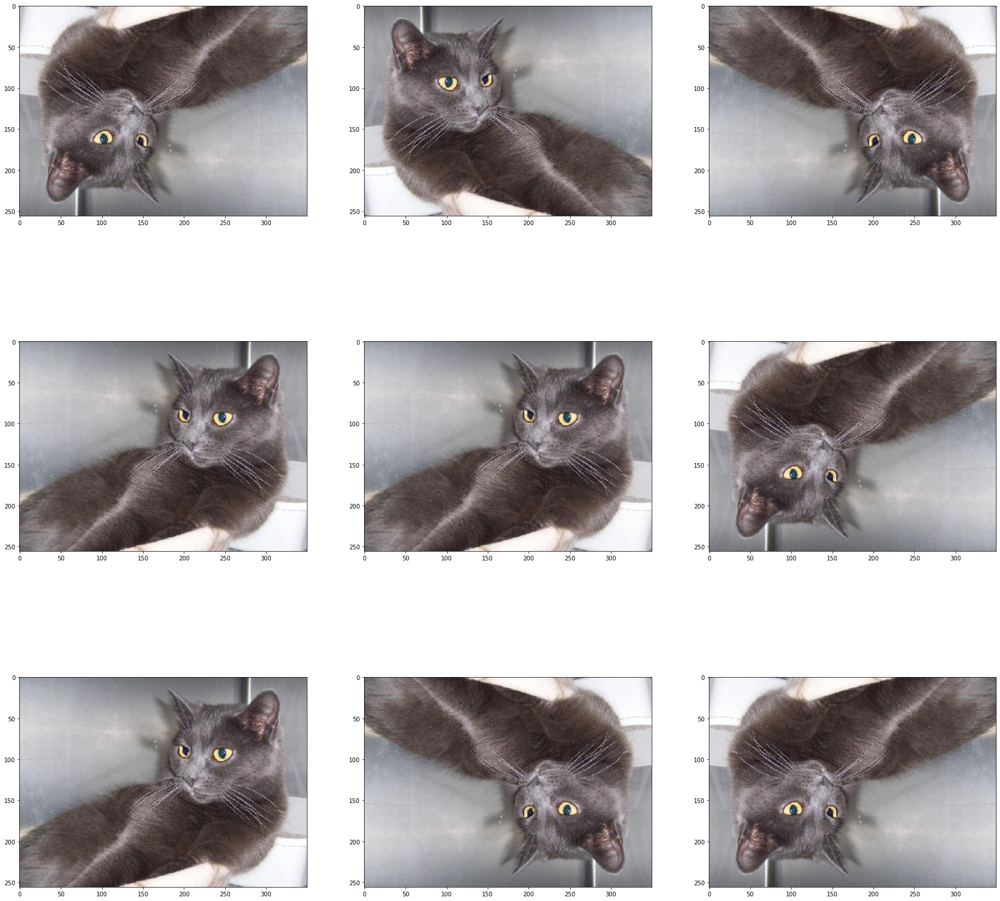

In [10]:
# horizontal, vertical filp
datagen = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True
)

show_datagen(datagen)

<class 'numpy.ndarray'>


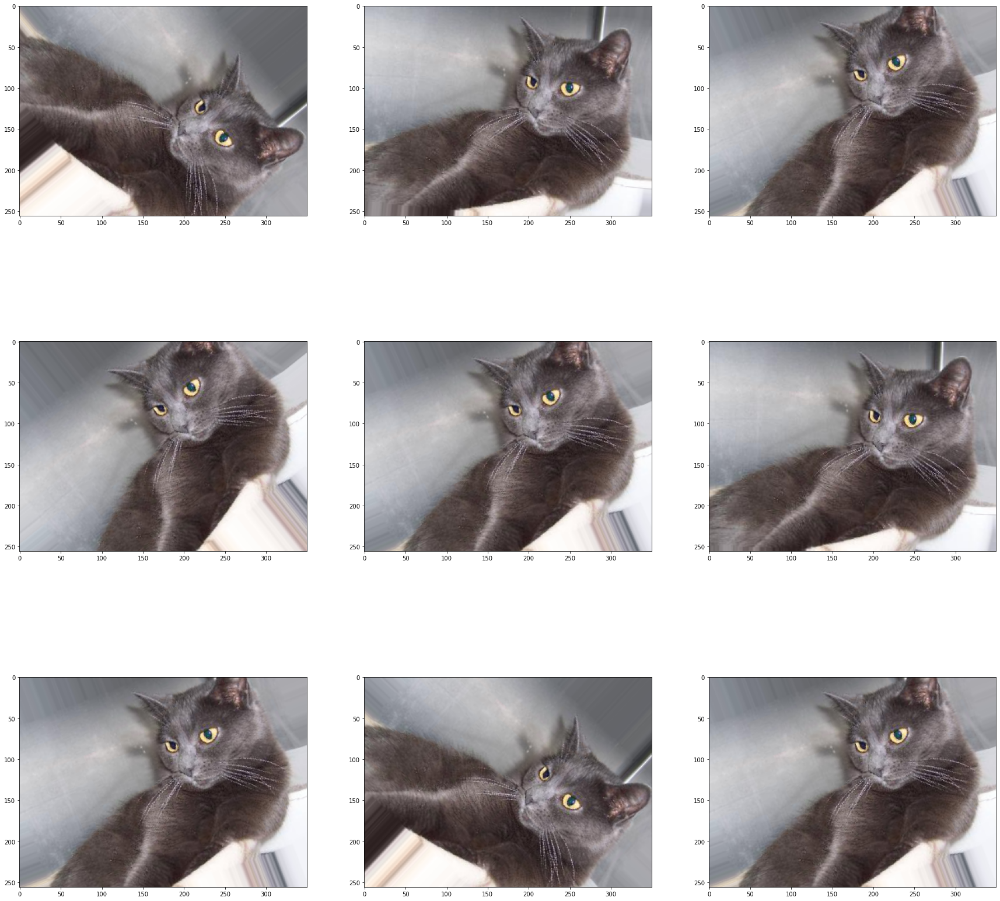

In [11]:
# random rotate 
datagen = ImageDataGenerator(
    rotation_range = 60
)
show_datagen(datagen)

<class 'numpy.ndarray'>


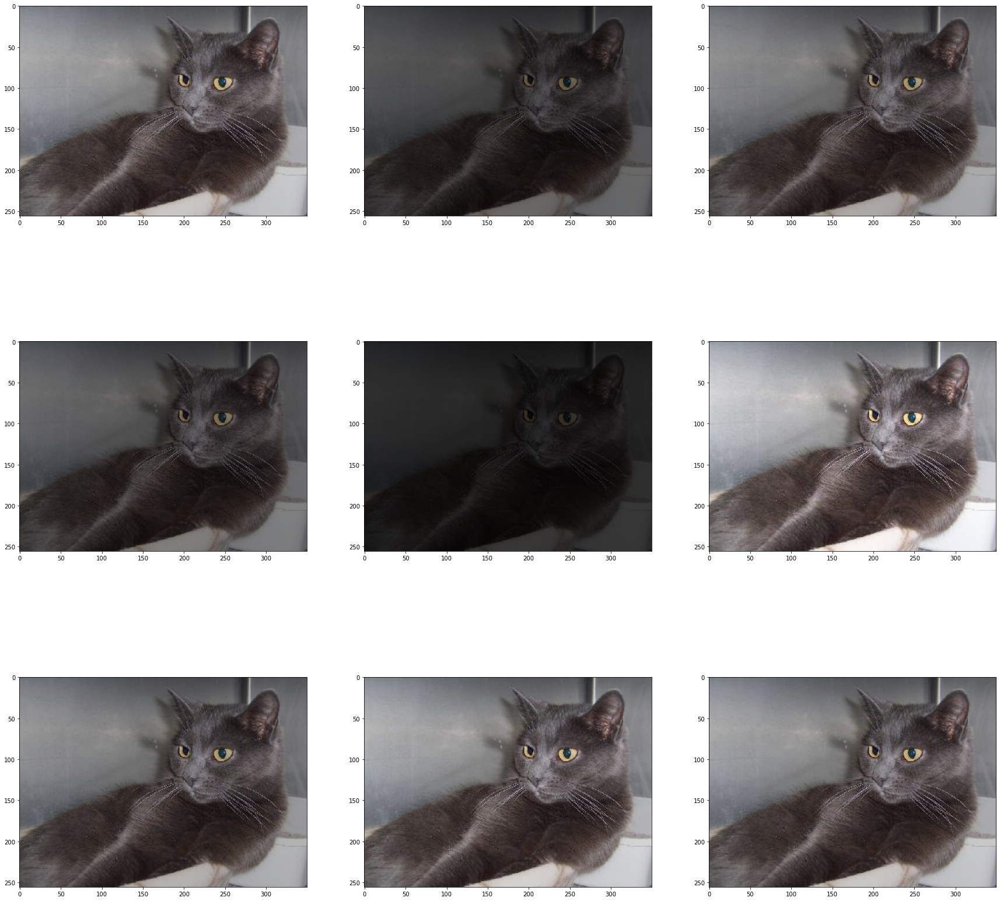

In [12]:
# random brightness
datagen = ImageDataGenerator(brightness_range = [0.2, 1.0])
show_datagen(datagen)

In [13]:
# ImageDataGenerator을 치는 것도 귀찮으니까
def show_datagen(args):
    datagen = ImageDataGenerator(**args)
    it = datagen.flow(samples, batch_size = 1)

    # nd.array로 사용할 수 있게 된다.
    batch = it.next()
    print(type(batch))


    fig = plt.figure(figsize = (30, 30))

    for i in range(9):
            #들어오는 그래프를 서브플롯중 어디에 위치하게할 것인가를 결정
            plt.subplot(3,3, i + 1)

            # nd.array로 사용할 수 있게 된다.
            batch = it.next()

            image = batch[0].astype('uint8')
            plt.imshow(image)
            plt.axis("off")

<class 'numpy.ndarray'>


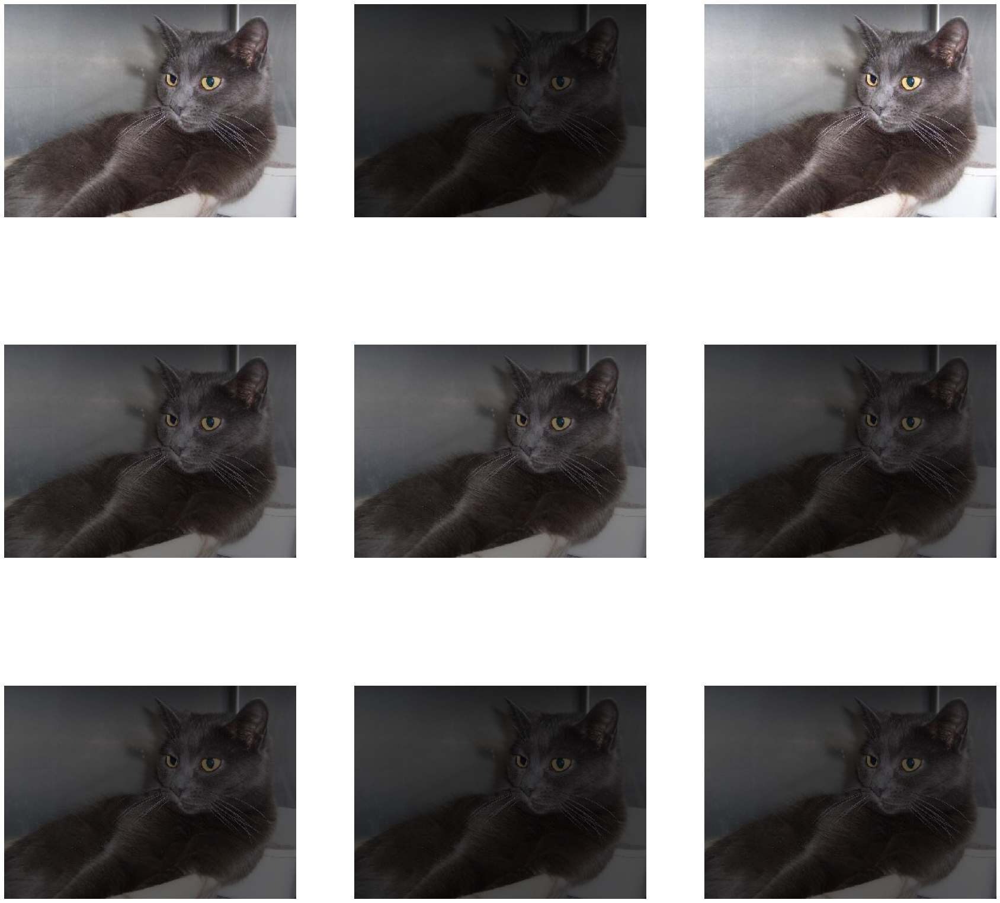

In [14]:
show_datagen({
    'brightness_range' : [0.2, 1.0]
})

<class 'numpy.ndarray'>


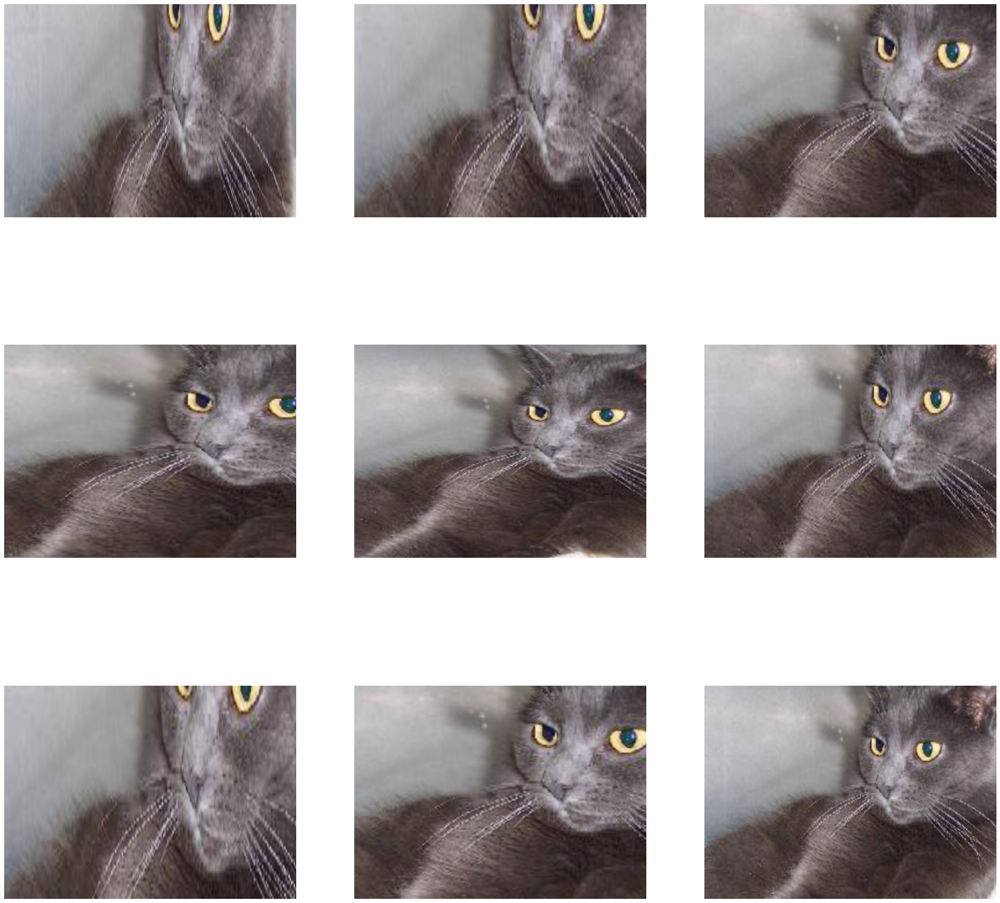

In [15]:
show_datagen({
    'zoom_range' : [0.2, 1.0]
})

<class 'numpy.ndarray'>


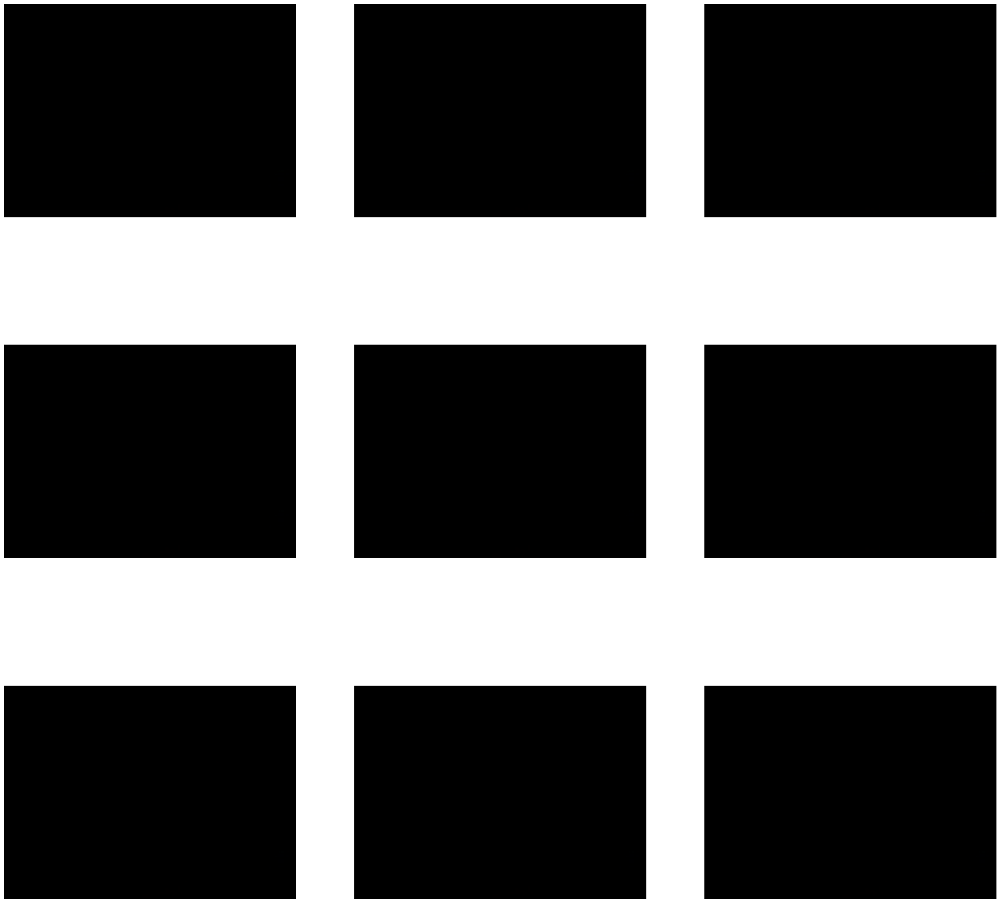

In [16]:
# 컴퓨터는 인식을 합니다. -> 숫자로 보기 때문에
show_datagen({
    'rescale' : 1./255
})

<class 'numpy.ndarray'>


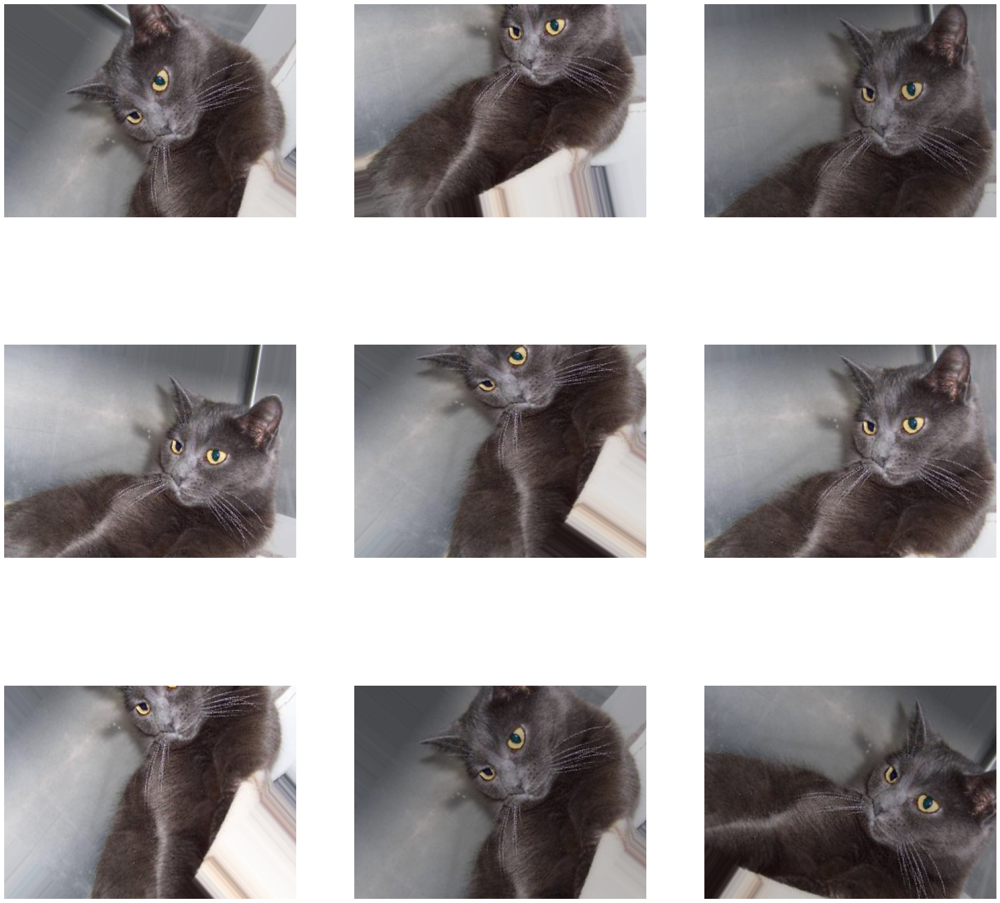

In [17]:
show_datagen(
    {
        'zoom_range' : [0.8, 1.0],
        'brightness_range' : [0.7, 1.0],
        'height_shift_range' : 0.2,
        'rotation_range': 60
    }
    
)


## flow_from_directory

```python

ImageDataGenerator.flow_from_directory(
    directory,
    target_size=(256, 256),
    color_mode="rgb",
    classes=None,
    class_mode="categorical",
    batch_size=32,
    shuffle=True,
    seed=None,
    save_to_dir=None,
    save_prefix="",
    save_format="png",
    follow_links=False,
    subset=None,
    interpolation="nearest",
)

```

#### tf.keras.preprocessing.image_dataset_from_directory 와의 차이점

- label_mode -> class_mode

- image_size -> target_size

- validation_split -> ImageDataGenerator에 정의한다.

In [18]:
# flow_from_directory()

datagen = ImageDataGenerator(**{
        'zoom_range' : [0.8, 1.0],
        'brightness_range' : [0.7, 1.0],
        'height_shift_range' : 0.2,
        'rotation_range': 60
    })

train_generator = datagen.flow_from_directory(
     './dataset/pets/',
    class_mode = 'categorical',
    target_size=(256, 256),
    batch_size = 50
)

Found 23422 images belonging to 2 classes.


In [ ]:
# generator는 끝없이 데이터를 읽어들이기 때문에 loop 정지조건을 구현해줘야한다. -> model에는 바로 적용이 가능하다.
for x_batch, y_batch in train_generator:
    print(x_batch.shape)

# 두 번째 방법 - 전처리 과정을 레이어로 구현하기


## tf.keras.layers.experimental.preprocessing

전처리를 위한 여러가지 연산들을 미리 layer로 만들어두었다. 모든 layer에 이름이 있다는 사실..

https://www.tensorflow.org/api_docs/python/tf/keras/layers/experimental/preprocessing/?hl=ko


### 사용할 수 있는 전처리 레이어

#### 1. Resizing

```python
    tf.keras.layers.experimental.preprocessing.Resizing(
        height, width, interpolation='bilinear', name=None
    )
 ```
     
     - 높이
     
     - 너비
     
     - rescale시에 interpolation 방법   
         { bilinear, nearest, bicubic, area, lanczos3, lanczos5, gaussian, mitchellcubic}
         
         
         
#### 2. Rescaling


#### 3. RandomTranslation
    
```python
    tf.keras.layers.experimental.preprocessing.RandomTranslation(
        height_factor, width_factor, fill_mode='reflect',
        interpolation='bilinear', seed=None, name=None, fill_value=0.0,
    )
```
    - 상하 변동계수   
        
        [0, 1]의 범위를 가지며 해당 축의 길이의 퍼센트만큼 움직이게 한다.
        
    - 좌우 변동계수
    
        [0, 1]의 범위를 가지며 해당 축의 길이의 퍼센트만큼 움직이게 한다.
    
    - fill_mode  
        {'constant', 'reflect', 'wrap', 'nearest'}
        
        
        
#### 4. RandomFlip

```python
    tf.keras.layers.experimental.preprocessing.RandomFlip(
        mode=HORIZONTAL_AND_VERTICAL, seed=None, name=None
    )
```
    
    - mode { "horizontal", "vertical", or "horizontal_and_vertical" }
    

#### 5. RandomHeight / RandomWidth
    - batch마다 크기를 변경하여 준다고 하네요. 학습시에 유용하지 않을까?
    

#### 6. RandomZoom

In [19]:
# 총 이미지의 갯수는 12500개씩 batch size를 지정하지 않으면 None으로 뜬다..
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    './dataset/pets/',
    label_mode = 'binary',
    batch_size = 50,
)

train_dataset

NameError: name 'tf' is not defined

In [ ]:
# batch하나를 들고온다.
image, label = next(iter(train_dataset))

In [ ]:
preprocessing_layer = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(225, 225),
#     layers.experimental.preprocessing.RandomFlip(), 
#     layers.experimental.preprocessing.RandomRotation(0.3),
#     layers.experimental.preprocessing.RandomContrast(0.8),
#     layers.experimental.preprocessing.RandomTranslation(0.3, 0.8, fill_mode='nearest'),
    layers.experimental.preprocessing.RandomHeight(0.5)
])

In [ ]:
import numpy as np

for images, labels in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(
            tf.expand_dims(first_image, 0), training=True
        )
        plt.imshow(augmented_image[0].numpy() / 255.)
        plt.title(int(labels[0]))
        plt.axis("off")

In [ ]:
# dataset에 대해서 직접 적용할 수 없다.
preprocessing_layer(train_dataset)

In [ ]:
# 그래서 batch마다 적용할 수 있도록 map을 사용한다.
AUTOTUNE = tf.data.experimental.AUTOTUNE

result_dataset = train_dataset.map(
    lambda x, y: (preprocessing_layer(x, training=True), y),
    num_parallel_calls=AUTOTUNE
)

In [ ]:
# RandomHeight으로 인해 Height는 None으로 사용되었다.
result_dataset

image, label = next(iter(result_dataset))

In [ ]:
for image, label in result_dataset:
    print(image.shape)